# Within-subject MVPA

In [1]:
### Import packages
### Please install nltools first if you have not installed it before. See tutorials for nltools: http://neurolearn.readthedocs.io/en/latest/ 
from nltools.mask import expand_mask, collapse_mask
from nltools.data import Brain_Data
import seaborn as sns
import numpy as np
import math
import glob
import pandas as pd
import os
import matplotlib as mpl
import scipy
%matplotlib inline
from nltools.stats import fdr, threshold, fisher_r_to_z, one_sample_permutation
from nilearn.plotting import plot_glass_brain, plot_stat_map

datadir ='G:\Trial_by_trial_betas'


C:\Anaconda\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
C:\Anaconda\Anaconda3\lib\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
### Show the verson of nlttols
import nltools
nltools.__version__

'0.3.14'

### Read data 

In [4]:
### Check the brain data files
glob.glob(os.path.join(datadir,'SEMI*.nii'))

['G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_101.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_102.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_103.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_104.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_105.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_106.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_107.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_108.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_109.nii',
 'G:\\GaoXiaoxue\\GI_reciprocity_fMRI\\Data_and Code\\Trial_by_trial_betas\\SEMI1101_trial_

In [5]:
### Load data
data = Brain_Data(glob.glob(os.path.join(datadir,'SEMI*.nii')))
info = glob.glob(os.path.join(datadir,'Trial_info.csv'))[0]
data.X = pd.read_csv(info)

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:551: RuntimeWarning: invalid value encountered in less
  vmax = max(data.max(), 0)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:543: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  fill_value=fill_value)
C:\Anaconda\Anaconda3\lib\site-packages\nilearn\image\resampling.py:550: RuntimeWarning: invalid value encountered in greater
  vmin = min(data.min(), 0)
C:\Anaconda\Anaconda3\lib\site-

In [9]:
### Print data
print(data)

nltools.data.brain_data.Brain_Data(data=(2823, 238955), Y=0, X=(2823, 33), mask=MNI152_T1_2mm_brain_mask.nii.gz, output_file=[])


In [10]:
### Get subject IDs
behav_data = data.X
subID = behav_data['Subject'].unique()
subID

array([1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111,
       1112, 1114, 1116, 1117, 1118, 1119, 1120, 1122, 1123, 1124, 1125,
       1126, 1127, 1128, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1136,
       1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1146, 1147,
       1148, 1149, 1150, 1151, 1152, 1153, 1154, 1156, 1157], dtype=int64)

### Reciprocity Prediction using brain data

In [11]:
### Delete the trials that the participants failed to respon when deciding how much to reciprocate
del_data = data[data.X['Reciprocity']!=-999]

In [12]:
del_data.shape()

(2801, 238955)

In [13]:
del_data.X.head()

,Subject,Run,Trial_num,Image_num,Condition_1possible_0impossible,Coplayer_number,Coplayer_cost,PainReduction,Second_order_belief,Second_order_belief_RT,...,Allocation_noresponse,Allocation_error_onset,Reciprocity_Model_Prediction,E2_model,PCare_model,Gratitude_rating,Indebtedness_rating,Perceived_care,Obligation_rating,Guilt_rating
0,1101,1,1,101,1,52,8,6.4,8,2.7763,...,0,-999.0,7.5,8,7.8692,49.698893,5.150463,40.216291,0.0,0.0
1,1101,1,2,102,0,41,16,12.8,0,3.5651,...,0,-999.0,19.1,0,20.0000,80.460612,7.964410,80.003074,0.0,0.0
2,1101,1,3,103,0,4,4,3.2,0,3.5620,...,0,-999.0,4.5,0,5.0000,39.737956,0.000000,40.400752,0.0,0.0
3,1101,1,4,104,1,34,14,11.2,14,2.3372,...,0,-999.0,13.4,14,13.7710,54.919886,9.614620,54.616066,0.0,0.0
4,1101,1,5,105,0,3,10,8.0,0,3.4771,...,0,-999.0,11.8,0,12.5000,64.916992,4.956055,60.005245,0.0,0.0


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.5534318720256124e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.1153974572030165e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.069550042449464e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.16
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.25
overall CV Correlation: 0.40


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.6574481221407495e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.519939089675518e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.9939154206081184e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.33
overall CV Correlation: 0.10


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.2818298422700991e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.697534735001227e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.629158141724929e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.06
overall CV Correlation: 0.34


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.4463292785649173e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6585413931125004e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.7600282120611155e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.78
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.557028887575143e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.4967571827546635e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.8872597463732745e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.23
overall CV Correlation: 0.28


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.03
overall CV Correlation: 0.57


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.744990013070492e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.071923243031961e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.787387470310932e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.36
overall CV Correlation: 0.27


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.1746127626111047e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.4728403385788624e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.85917148343151e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.97
overall CV Correlation: 0.15


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.3025323869774184e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.2668861393858606e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.215280841573076e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.26
overall CV Correlation: 0.14


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.812892212020415e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)


overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.44
overall CV Correlation: 0.47


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.00
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.52
overall CV Correlation: -0.01


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6658150414627926e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.575957935846418e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0998665917204562e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.67
overall CV Correlation: 0.25


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.8165882071107262e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.6567378458585154e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.16
overall CV Correlation: 0.20


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.0504099812180812e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.422981910081944e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3347653649020685e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 2.69
overall CV Correlation: -0.11


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.8011942987404836e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.132654669002477e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.3045108810702004e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.63
overall CV Correlation: 0.31


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.04035509096434e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.2812237493164957e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.4134994508196996e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.08
overall CV Correlation: 0.13


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.075742492977042e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.596550221147027e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.767767152775605e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.82
overall CV Correlation: -0.06


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.4091904410615825e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.049152835250425e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.8804476076848005e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.36
overall CV Correlation: 0.21


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.830412762643846e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.365265896121855e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.200134876152788e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.56
overall CV Correlation: -0.16


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 4.03
overall CV Correlation: 0.10


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.128844987074444e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 8.633155523796177e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.509695976182229e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.02
overall CV Correlation: 0.27


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.427087686385221e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.266032422288845e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.080657151599553e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 4.41
overall CV Correlation: 0.41


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.628168888601067e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.9884913271539517e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.157081269160699e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.81
overall CV Correlation: 0.29


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.02
overall CV Correlation: -0.17


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.411592228834252e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.486140761794104e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.0400269978561028e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.92
overall CV Correlation: 0.08


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.372657969042848e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.689992121915566e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.246477385867365e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 9.94
overall CV Correlation: -0.19


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.09
overall CV Correlation: 0.28


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.4027516037629084e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.8023264658495464e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.9861319699998603e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.17
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3844859481082494e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.736495391924109e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.053896785980669e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.64
overall CV Correlation: 0.19


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.9986512828372724e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.489593680683356e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.800736436687657e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.91
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.0242865222664932e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3036340895666854e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.2012869810007487e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.19
overall CV Correlation: 0.17


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 2.21
overall CV Correlation: 0.29


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.69
overall CV Correlation: 0.27


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.461847259382921e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.006305604458248e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.291384942372133e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.50
overall CV Correlation: 0.41


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.518847625447961e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.8267797941007302e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.8453020445008406e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.83
overall CV Correlation: 0.35


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.877926507163011e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.715432654402775e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.258603857389744e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.46
overall CV Correlation: -0.24


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.5216225552071592e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.099653156368731e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.510884383217672e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.15
overall CV Correlation: 0.02


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3009779920025721e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.7274043528914262e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.7758447157234514e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.94
overall CV Correlation: 0.17


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6200219832285256e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0330329419948612e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.9748677360098554e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 9.09
overall CV Correlation: -0.13


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.37
overall CV Correlation: 0.08


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.63
overall CV Correlation: -0.03


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.663375748250928e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0148011259379928e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0342429962738606e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.86
overall CV Correlation: -0.15


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.63
overall CV Correlation: 0.45


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 3.54
overall CV Correlation: 0.03


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.97
overall CV Correlation: -0.01


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.973204177829757e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.3886087774371845e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.7080176323579508e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 4.54
overall CV Correlation: 0.32


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.880413063621745e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.5321328084592096e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.551877725271879e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.07
overall CV Correlation: 0.35


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.3838699781417745e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.287750326488094e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.813168175132887e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)


overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.79
overall CV Correlation: 0.04


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3504797280461389e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6331526353496884e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.7198596324874416e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.77
overall CV Correlation: 0.18


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.05
overall CV Correlation: 0.39


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.770158857856586e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.394092473740784e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.752628074948916e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.68
overall CV Correlation: 0.06


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


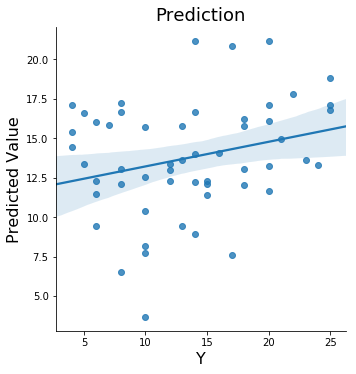

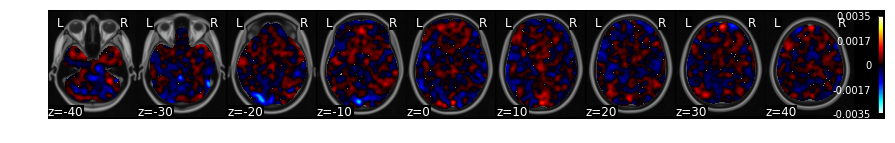

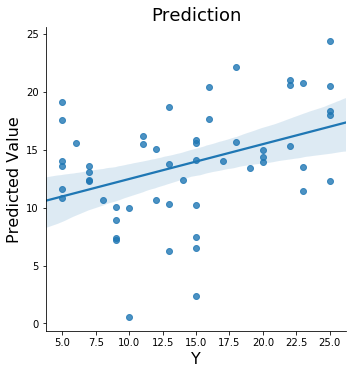

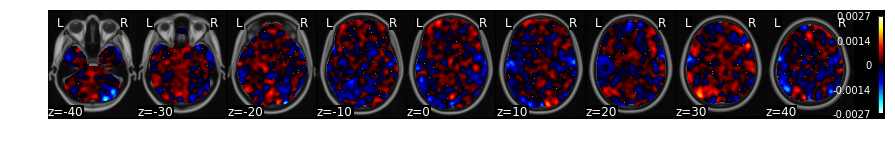

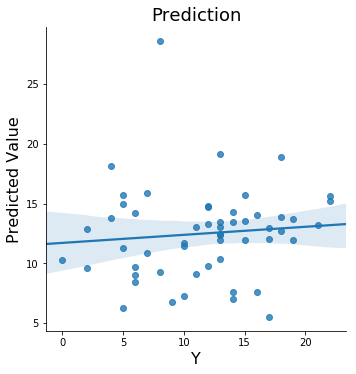

...

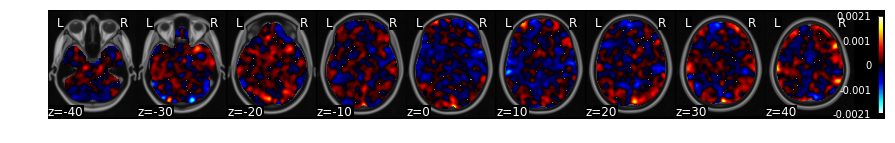

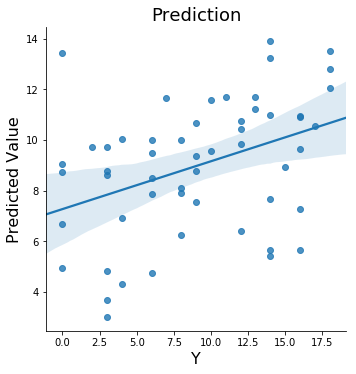

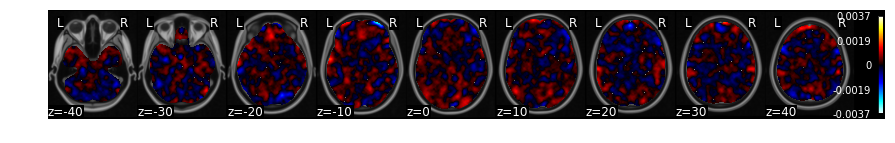

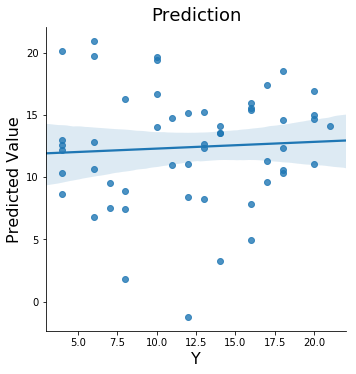

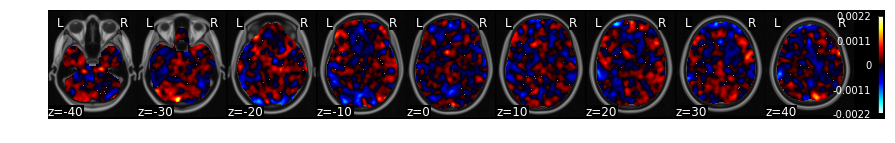

In [14]:
### Within subject MVPA for reciprocity
results_r_Reci = np.zeros((1,53))
stats_Reci = []
i=0

for sub in subID:
    sub_data = del_data[del_data.X['Subject']==sub]
    sub_data.Y = sub_data.X['Reciprocity']
    sub_stats = sub_data.predict(algorithm='ridge',  cv_dict={'type': 'kfolds','n_folds': 5})
    results_r_Reci[0,i-1] = sub_stats['r_xval']
    stats_Reci.append(sub_stats)
    i=i+1

{'mean': 0.1785230678243285, 'p': 0.0}


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


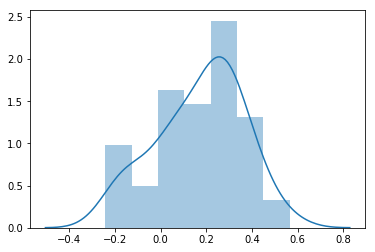

In [15]:
### Fisher-z transformation and one-sample permutation t test
group_stat_Reci = one_sample_permutation(np.array(fisher_r_to_z(results_r_Reci[0,:])),n_permute=5000)
print(group_stat_Reci)
sns.distplot(results_r_Reci[0,:])

In [17]:
### Print mean and SE
r_mean_Reci = np.mean(results_r_Reci[0,:])
print(r_mean_Reci)
r_sd_Reci = np.std(results_r_Reci[0,:],ddof=1)
n = len(results_r_Reci[0,:])
r_se_Reci = (r_sd_Reci/math.sqrt(n))
print(r_se_Reci)

0.17081076741698034
0.02607312823547379


threshold is ignored for simple axial plots


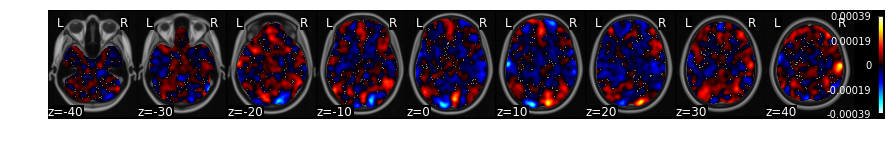

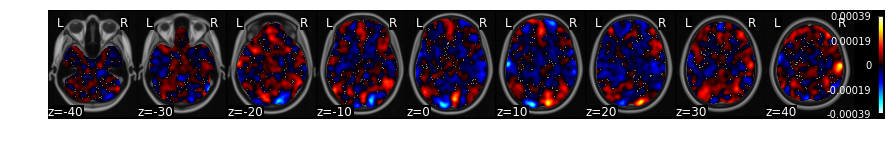

In [18]:
### Plot and write out the group-level whole brain pattern for reciprocity
Reci_image=Brain_Data()

for i,sub in enumerate(subID):
    Reci_image = Reci_image.append(stats_Reci[i]['weight_map'])

Reci_weight_map = Reci_image.mean()

Reci_weight_map.plot()
Reci_weight_map.write(os.path.join(datadir,'Brain_predicted_data','Reci_prediction_weight_map.nii.gz'))

In [19]:
### Export cross-validated neural predictions for reciprocity
Reci_yfit_xval = []

for i,sub in enumerate(subID):
    Reci_yfit_xval = Reci_yfit_xval + list(stats_Reci[i]['yfit_xval'])
       
np.savetxt(os.path.join(datadir,'Brain_predicted_data','Reci_yfit_xval.txt'),Reci_yfit_xval) 

### Appraisals prediction whole brain 

C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.5534318720256124e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.1153974572030165e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.069550042449464e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.09
overall CV Correlation: 0.27


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.41
overall CV Correlation: 0.35


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.6574481221407495e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.519939089675518e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.9939154206081184e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.07
overall CV Correlation: 0.10


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.2818298422700991e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.697534735001227e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.629158141724929e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.80
overall CV Correlation: 0.12


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.4463292785649173e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6585413931125004e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.7600282120611155e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.00
overall CV Correlation: 0.18


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.557028887575143e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.4967571827546635e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.8872597463732745e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.13
overall CV Correlation: 0.29


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.08
overall CV Correlation: 0.58


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.744990013070492e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.071923243031961e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.787387470310932e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.71
overall CV Correlation: 0.15


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.1746127626111047e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.4728403385788624e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.85917148343151e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.70
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.3025323869774184e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.2668861393858606e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.215280841573076e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.98
overall CV Correlation: 0.08


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.812892212020415e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)


overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.68
overall CV Correlation: 0.47


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.95
overall CV Correlation: 0.37


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.95
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6658150414627926e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.575957935846418e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0998665917204562e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.53
overall CV Correlation: 0.25


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.8165882071107262e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.6567378458585154e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)


overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.90
overall CV Correlation: 0.12


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.0504099812180812e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.422981910081944e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3347653649020685e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.87
overall CV Correlation: 0.22


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.8011942987404836e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.132654669002477e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.3045108810702004e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.54
overall CV Correlation: 0.29


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.04035509096434e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.2812237493164957e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.4134994508196996e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.28
overall CV Correlation: 0.08


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.075742492977042e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.596550221147027e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.767767152775605e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.12
overall CV Correlation: -0.02


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.4091904410615825e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.049152835250425e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.8804476076848005e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.81
overall CV Correlation: 0.34


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.830412762643846e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.365265896121855e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.200134876152788e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.25
overall CV Correlation: -0.16


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.03
overall CV Correlation: 0.33


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.128844987074444e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 8.633155523796177e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.509695976182229e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.63
overall CV Correlation: 0.28


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.427087686385221e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.266032422288845e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.080657151599553e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.52
overall CV Correlation: 0.42


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.628168888601067e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.9884913271539517e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.157081269160699e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.01
overall CV Correlation: 0.26


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.16
overall CV Correlation: -0.12


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.411592228834252e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.486140761794104e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.0400269978561028e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.07
overall CV Correlation: 0.22


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.372657969042848e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.689992121915566e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.246477385867365e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.78
overall CV Correlation: -0.16


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.03
overall CV Correlation: 0.43


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.4027516037629084e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.8023264658495464e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.9861319699998603e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 9.24
overall CV Correlation: 0.27


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3844859481082494e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.736495391924109e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.053896785980669e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.10
overall CV Correlation: 0.18


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.9986512828372724e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.489593680683356e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.800736436687657e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.39
overall CV Correlation: 0.25


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.0242865222664932e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3036340895666854e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.2012869810007487e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.15
overall CV Correlation: 0.21


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.51
overall CV Correlation: 0.45


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.33
overall CV Correlation: 0.22


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.461847259382921e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.006305604458248e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.291384942372133e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.82
overall CV Correlation: 0.41


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.518847625447961e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.8267797941007302e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.8453020445008406e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.89
overall CV Correlation: 0.39


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.877926507163011e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.715432654402775e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.258603857389744e-09
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 10.57
overall CV Correlation: 0.03


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.5216225552071592e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.099653156368731e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.510884383217672e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 9.16
overall CV Correlation: 0.18


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3009779920025721e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.7274043528914262e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.7758447157234514e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 11.21
overall CV Correlation: -0.06


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6200219832285256e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0330329419948612e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.9748677360098554e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.69
overall CV Correlation: -0.12


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.17
overall CV Correlation: 0.16


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.91
overall CV Correlation: 0.33


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.663375748250928e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0148011259379928e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0342429962738606e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.28
overall CV Correlation: -0.13


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.63
overall CV Correlation: 0.42


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 10.41
overall CV Correlation: 0.01


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.81
overall CV Correlation: 0.07


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.973204177829757e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.3886087774371845e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.7080176323579508e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is n

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.92
overall CV Correlation: 0.31


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.880413063621745e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.5321328084592096e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.551877725271879e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is no

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.82
overall CV Correlation: 0.39


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.3838699781417745e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.287750326488094e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.813168175132887e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)


overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 7.20
overall CV Correlation: 0.07


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.3504797280461389e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6331526353496884e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.7198596324874416e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is 

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 6.35
overall CV Correlation: 0.23


C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots
overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 5.78
overall CV Correlation: 0.35


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.770158857856586e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.394092473740784e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.752628074948916e-08
  ' condition number: {}'.format(rcond), RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\linalg\basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 8.43
overall CV Correlation: -0.09


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Anaconda\Anaconda3\lib\site-packages\scipy\stats\stats.py:1633: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


threshold is ignored for simple axial plots


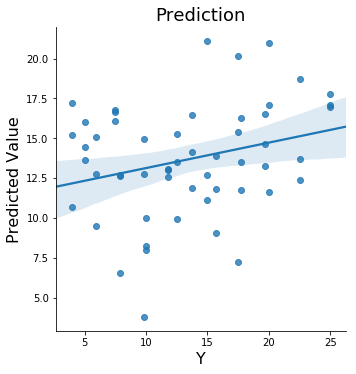

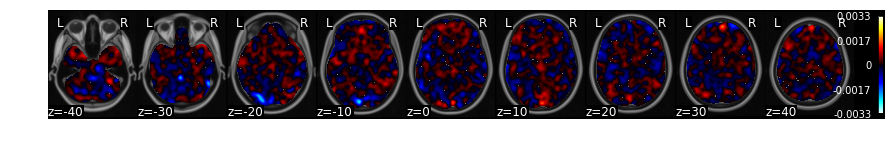

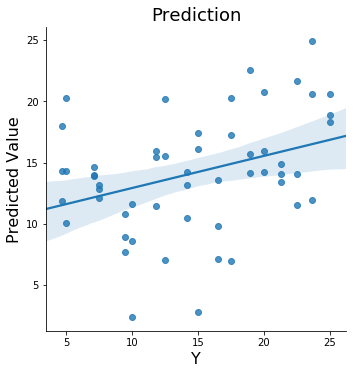

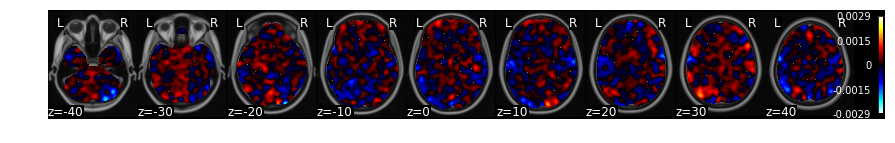

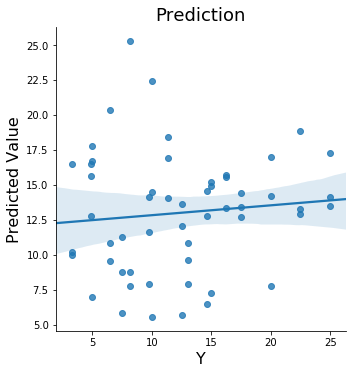

...

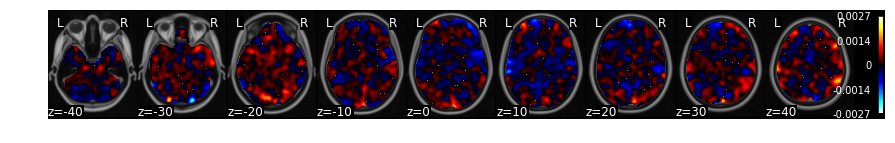

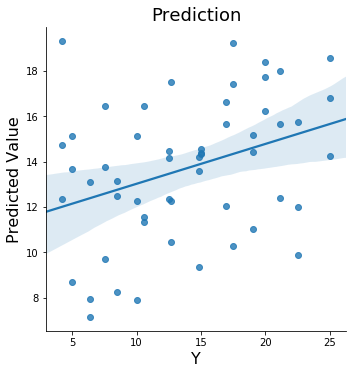

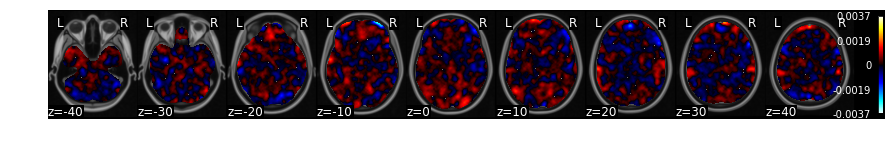

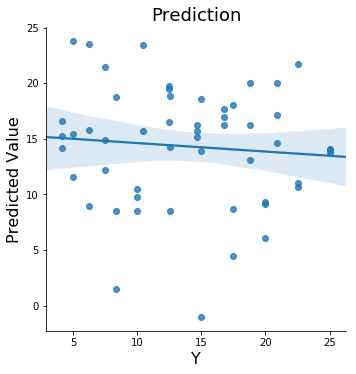

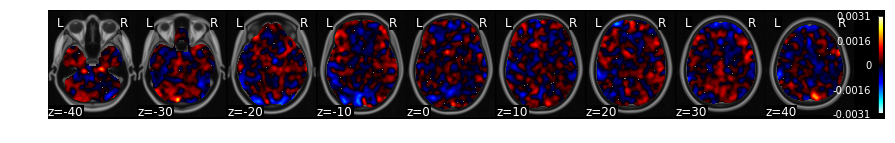

In [20]:
### Within subject MVPA for communal concern

results_r_PCare_w = np.zeros((1,53))
stats_PCare_w = []
i=0

for sub in subID:
    sub_data = del_data[del_data.X['Subject']==sub]
    sub_data.Y = sub_data.X['PCare_model']
    sub_stats = sub_data.predict(algorithm='ridge',  cv_dict={'type': 'kfolds','n_folds': 5})
    results_r_PCare_w[0,i-1] = sub_stats['r_xval']
    stats_PCare_w.append(sub_stats)
    i = i+1

{'mean': 0.2091120957568269, 'p': 0.0}


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


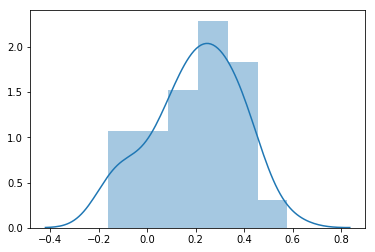

In [21]:
### Fisher-z transformation and one-sample permutation t test
group_stat_PCare_w = one_sample_permutation(np.array(fisher_r_to_z(results_r_PCare_w[0,:])),n_permute=5000)
print(group_stat_PCare_w)
sns.distplot(results_r_PCare_w[0,:])

In [24]:
### Print mean and SE
r_mean_PCare = np.mean(results_r_PCare_w[0,:])
print(r_mean_PCare)
r_sd_PCare = np.std(results_r_PCare_w[0,:],ddof=1)
n = len(results_r_PCare_w[0,:])
r_se_PCare = (r_sd_PCare/math.sqrt(n))
print(r_se_PCare)

0.19977986265794812
0.024599391704168912


threshold is ignored for simple axial plots


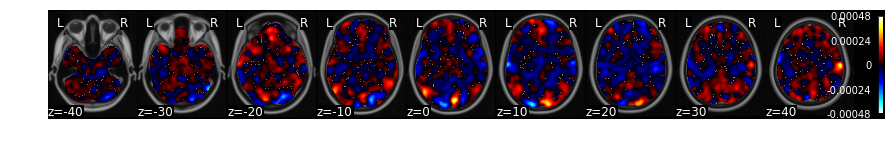

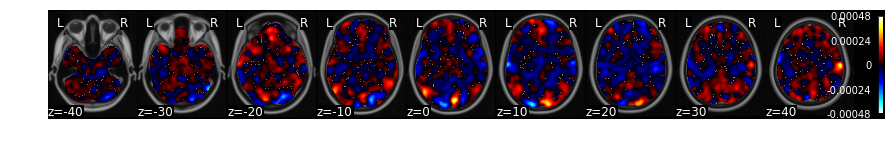

In [25]:
### Plot and write out the group-level whole brain pattern for reciprocity
PCare_image=Brain_Data()

for i,sub in enumerate(subID):
    PCare_image = PCare_image.append(stats_PCare_w[i]['weight_map'])

PCare_weight_map = PCare_image.mean()

PCare_weight_map.plot()
PCare_weight_map.write(os.path.join(datadir,'Brain_predicted_data','PCare_prediction_weight_map.nii.gz'))

In [26]:
### Export cross-validated neural predictions for communal concern
PCare_yfit_xval = []

for i,sub in enumerate(subID):
    PCare_yfit_xval = PCare_yfit_xval + list(stats_PCare_w[i]['yfit_xval'])
    
np.savetxt(os.path.join(datadir,'Brain_predicted_data','PCare_yfit_xval.txt'),PCare_yfit_xval)               

In [ ]:
### Within subject MVPA for obligation

results_r_E2_w = np.zeros((1,53))
stats_E2_w = []
i=0

for sub in subID:
    sub_data = del_data[del_data.X['Subject']==sub]
    sub_data.Y = sub_data.X['E2_model']
    sub_stats = sub_data.predict(algorithm='ridge',  cv_dict={'type': 'kfolds','n_folds': 5})
    results_r_E2_w[0,i-1] = sub_stats['r_xval']
    stats_E2_w.append(sub_stats)
    i = i+1

{'mean': 0.09795922512356557, 'p': 0.0002}


C:\Anaconda\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


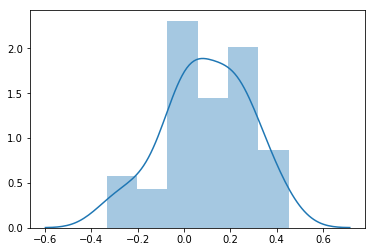

In [28]:
### Fisher-z transformation and one-sample permutation t test
group_stat_E2_w = one_sample_permutation(np.array(fisher_r_to_z(results_r_E2_w[0,:])),n_permute=5000)
print(group_stat_E2_w)
sns.distplot(results_r_E2_w[0,:])

In [29]:
### Print mean and SE
r_mean_E2 = np.mean(results_r_E2_w[0,:])
print(r_mean_E2)
r_sd_E2 = np.std(results_r_E2_w[0,:],ddof=1)
n = len(results_r_E2_w[0,:])
r_se_E2 = (r_sd_E2/math.sqrt(n))
print(r_se_E2)

0.09489037101619427
0.025413861584196437


threshold is ignored for simple axial plots


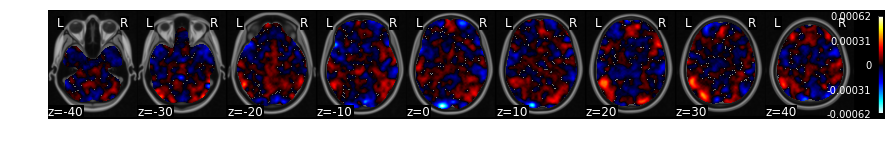

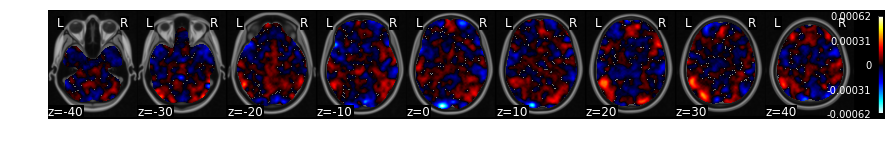

In [30]:
### Plot and write out the group-level whole brain pattern for reciprocity
E2_image=Brain_Data()

for i,sub in enumerate(subID):
    E2_image = E2_image.append(stats_E2_w[i]['weight_map'])

E2_weight_map = E2_image.mean()

E2_weight_map.plot()
E2_weight_map.write(os.path.join(datadir,'Brain_predicted_data','E2_prediction_weight_map.nii.gz'))

In [31]:
### Export cross-validated neural predictions for obligation
E2_yfit_xval = []

for i,sub in enumerate(subID):
    E2_yfit_xval = E2_yfit_xval + list(stats_E2_w[i]['yfit_xval'])
    
np.savetxt(os.path.join(datadir,'Brain_predicted_data','E2_yfit_xval.txt'),E2_yfit_xval)               